# SPHEREx Anomaly Detection — Inference Pipeline (`v0.2`, FITS input)

---

## Overview

This notebook implements an inference pipeline for detecting anomalies in **SPHEREx satellite images**. Given a directory of SPHEREx Level 2 FITS files, the pipeline groups them by observation ID, preprocesses each 6-band observation on-the-fly, and runs it through a pretrained **Vision Transformer (ViT)** binary classifier to produce an anomaly probability score per observation.

All functions are encapsulated in `spherex_anomaly_vit.py` — no model or preprocessing code is defined in this notebook.

---

## Input Data Structure

SPHEREx Level 2 FITS files follow this naming convention:
```
level2_{obs_id}D{band_id}_spx_l2b-{version}.fits
```

For example:
```
level2_2025W39_1A_0001_1D1_spx_l2b-v20-2025-273.fits  ← obs_id: 2025W39_1A_0001_1, band: 1
level2_2025W39_1A_0001_1D2_spx_l2b-v20-2025-273.fits  ← obs_id: 2025W39_1A_0001_1, band: 2
...
level2_2025W39_1A_0001_1D6_spx_l2b-v20-2025-273.fits  ← obs_id: 2025W39_1A_0001_1, band: 6
```

6 FITS files (D1~D6) are grouped into a single observation and processed together.

---

## Pipeline
```
6 × FITS (level2_*.fits)
    ↓  Read IMAGE HDU
    ↓  Flag bad pixels (TRANSIENT, OVERFLOW, SOURCE, NONFUNC) → NaN
    ↓  Subtract ZODI
    ↓  8×8 block mean → downsize (6, 255, 255)
    ↓  NaN → quality map (6, 255, 255)  [0, 1]
    ↓  per-band Median MAD Scaling → NaN→0 → clip [-5, 5]
    ↓  3 tiles concat → 4-channel image (4, 255, 765)
    ↓  ViT Binary Classifier → anomaly probability [0, 1]
```

| Input Channel | Description |
|---|---|
| bandA | bands 1, 2, 3 concatenated horizontally |
| bandB | bands 4, 5, 6 concatenated horizontally |
| qualA | quality map of bands 1, 2, 3 |
| qualB | quality map of bands 4, 5, 6 |

### Missing Band Handling
If any of the 6 bands is missing, the corresponding channel is filled with NaN → treated as all-zero after scaling, with quality map = 0.

---

## Pretrained Model

| Item | Value |
|---|---|
| Architecture | Vision Transformer Binary Classifier |
| Input resolution | 255 × 765 (patch size 15×15, 867 tokens) |
| Training data | 2,885 (anomaly) + 4,796 (normal) = 7,681 samples |
| Best checkpoint | `best-epoch=011-val_AUROC=0.9022.ckpt` |
| Test AUROC | **0.9022** |

### Best Thresholds (on Test Set)

| Strategy | Threshold | Note |
|---|---|---|
| Maximize F1 | 0.9290 | F1 = 0.8398 |
| Youden's J | 0.8845 | Maximizes TPR − FPR |
| Precision ≥ 0.9 | 0.9550 | Recall = 0.7737 |

---

## Performance Notes

- **Main bottleneck**: on-the-fly preprocessing (FITS I/O + flagging + ZODI subtraction + downsampling + robust scaling + 4-channel construction), not the model forward pass.
- **`num_workers`** is the most critical tuning parameter. On a 16-thread / 8 physical core machine, `num_workers=8` is recommended.
- **GPU inference** showed marginal or no speedup over CPU, since the preprocessing bottleneck is CPU-bound.
- FITS preprocessing is heavier than `.npy` preprocessing due to FITS I/O and flagging overhead.

---

## Required Files
```
├── spherex_anomaly_vit.py                       # preprocessing + model + inference + visualization
├── best-epoch=011-val_AUROC=0.9022.ckpt        # pretrained weights
└── test-fits-images/                            # directory of level2_*.fits files
```

---

## Steps

1. **Set paths** — pretrained model path, FITS image directory
2. **Load model** — `load_model(ckpt_path)`
3. **Build DataLoader** — `build_fits_dataloader(fits_dir, num_workers=8)`
4. **Run inference** — `run_inference_fits_tqdm(model, fits_loader)` → `obs_ids`, `probs`, `paths_list`
5. **Organize results** — `pandas` DataFrame with `obs_id`, `prob`, `filepath1`~`filepath6`
6. **Apply thresholds** — count anomalies per threshold strategy
7. **Save results** — anomaly list as `.csv`, full predictions as `.parquet`
8. **Visualize** — `visualize_raw_bands_fits()` / `visualize_model_input_fits()` / `visualize_grad_attention_fits()`

---

## Result DataFrame Structure

| Column | Description |
|---|---|
| `obs_id` | SPHEREx observation ID |
| `prob` | anomaly probability [0, 1] |
| `filepath1` ~ `filepath6` | full path to each band FITS file |

In [23]:
!pip freeze | grep -E "numpy|torch|astropy|scikit|matplotlib|pandas|tqdm|pillow"

astropy==6.1.0
astropy-iers-data==0.2024.6.3.0.31.14
matplotlib==3.9.0
matplotlib-inline==0.1.6
numpy==1.26.4
pandas==2.2.2
pillow==10.2.0
pytorch-lightning==2.6.1
pytorch-tabnet==4.1.0
scikit-image==0.24.0
scikit-learn==1.5.0
scikit-posthocs==0.9.0
torch==2.2.0
torchaudio==2.2.0
torchmetrics==1.8.2
torchvision==0.17.0
tqdm==4.66.4


## Basic Packages and Settings

In [1]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["font.family"] = "serif"
matplotlib.rcParams["mathtext.fontset"] = "stix"

import torch
import torch.nn.functional as F

In [2]:
# reload `spherex_anomaly_vit.py`
%load_ext autoreload
%autoreload 2

In [3]:
!pwd

/app/spherex-clf-abnormal-images/notebook


In [4]:
pretrained_dir = '/app/spherex-clf-abnormal-images/pretrained-data/'
modelpath = pretrained_dir + 'best-epoch=011-val_AUROC=0.9022.ckpt'

In [5]:
!ls -lh {pretrained_dir}

total 9.0M
drwxr-xr-x 2 root root 4.0K Apr 13 02:31  __pycache__
-rw-r--r-- 1 root root 8.8M Apr  7 05:35 'best-epoch=011-val_AUROC=0.9022.ckpt'
-rw-r--r-- 1 root root  52K Apr 13 02:43  spherex_anomaly_vit.py
-rw-r--r-- 1 root root  15K Apr  9 06:12  spherex_anomaly_vit_backup_v1.py
-rw-r--r-- 1 root root  15K Apr 10 01:33  spherex_anomaly_vit_backup_v2.py
-rw-r--r-- 1 root root  20K Apr 10 04:11  spherex_anomaly_vit_backup_v3_npy.py
-rw-r--r-- 1 root root  24K Apr 10 06:16  spherex_anomaly_vit_backup_v4.py
-rw-r--r-- 1 root root  35K Apr 13 02:31  spherex_anomaly_vit_backup_v5.py


In [6]:
import sys
sys.path.append(pretrained_dir)
from spherex_anomaly_vit import (
    load_model,
    build_dataloader,
    build_fits_dataloader,
    run_inference,
    run_inference_tqdm,
    run_inference_fits_tqdm,
    visualize_raw_bands,
    visualize_model_input,
    visualize_grad_attention,
    visualize_raw_bands_fits,        # 🔥
    visualize_model_input_fits,      # 🔥
    visualize_grad_attention_fits,   # 🔥
    preprocess_file,
    preprocess_fits,
    parse_fits_dir,
    compute_grad_attention_maps,
)

## Load the Pretrained Model 

In [7]:
model = load_model(modelpath)

✅ Model loaded: /app/spherex-clf-abnormal-images/pretrained-data/best-epoch=011-val_AUROC=0.9022.ckpt
   Parameters : 756,865


## Raw fits input

In [8]:
!ls /data/jhpyo/spherex-anomaly-inspect/

 03.make-image-cubes.py			 good-images	    utils.py
'Anomaly Inspector - Anomaly List.csv'	 test-fits-images
 anomaly-images				 test-images


In [9]:
test_fits_dir = '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/'

file_fits_list = sorted(glob.glob(os.path.join(test_fits_dir, '*.fits')))
print(f"총 파일 수: {len(file_fits_list)}")

총 파일 수: 648


In [12]:
file_fits_list[:12]

['/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D1_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D2_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D3_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D4_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D5_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_1D6_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_2D1_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_2D2_spx_l2b-v20-2025-273.fits',
 '/data/jhpyo/spherex-anomaly-inspect/test-fits-images/level2_2025W39_1A_0001_2D3_spx_l2b-v20-2025-273.fits',
 '/data/jh

In [10]:
## fits data loader 
fits_loader = build_fits_dataloader(test_fits_dir, batch_size=8, num_workers=8)

✅ Found 109 observations in /data/jhpyo/spherex-anomaly-inspect/test-fits-images/


In [11]:
%%time
obs_ids, probs, paths_list = run_inference_fits_tqdm(model, fits_loader)
print(f"✅ Inference complete: {len(obs_ids)} samples")

Inference: 100%|███████████████████████████████████████████████████| 109/109 [00:09<00:00, 11.67files/s]

✅ Inference complete: 109 samples
CPU times: user 25 s, sys: 9.04 s, total: 34 s
Wall time: 9.35 s


In [12]:
import pandas as pd

df_result = pd.DataFrame({
    "obs_id": obs_ids,
    "prob"  : probs,
})

for b in range(1, 7):
    df_result[f"filepath{b}"] = [p[b] for p in paths_list]

df_result = df_result.sort_values("prob", ascending=False).reset_index(drop=True)
print(f"Total samples: {len(df_result)}")
df_result.head(2).T


Total samples: 109


,0,1
obs_id,2025W39_1A_0025_1,2025W39_1A_0025_3
prob,0.989117,0.989
filepath1,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...
filepath2,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...
filepath3,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...
filepath4,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...
filepath5,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...
filepath6,/data/jhpyo/spherex-anomaly-inspect/test-fits-...,/data/jhpyo/spherex-anomaly-inspect/test-fits-...


In [13]:
df_result[['obs_id','prob']].head(20)

,obs_id,prob
0,2025W39_1A_0025_1,0.989117
1,2025W39_1A_0025_3,0.989000
2,2025W39_1A_0025_2,0.988822
3,2025W39_1A_0025_4,0.988485
4,2025W39_1A_0034_3,0.800188
5,2025W39_1A_0006_1,0.547172
6,2025W39_1A_0004_1,0.337448
7,2025W39_1A_0004_3,0.331201
8,2025W39_1A_0029_1,0.270272
9,2025W39_1A_0034_4,0.222007


## Statistics of Inference Results 

In [14]:
# Best thresholds (from test set evaluation)
thr_f1     = 0.9290   # Maximize F1  →  F1 = 0.8398
thr_youden = 0.8845   # Youden's J   →  Maximizes TPR - FPR
thr_prec90 = 0.9550   # Precision >= 0.9  →  Recall = 0.7737

n_total = len(df_result)
for name, thr in [("F1 max", thr_f1), ("Youden's J", thr_youden), ("Prec>=0.9", thr_prec90)]:
    n_anomaly = (df_result["prob"] >= thr).sum()
    n_normal  = (df_result["prob"] <  thr).sum()
    frac      = n_anomaly / n_total
    print(f"[{name:12s}]  threshold={thr:.4f}  |  anomaly={n_anomaly} ({frac:.1%})  normal={n_normal}")

[F1 max      ]  threshold=0.9290  |  anomaly=4 (3.7%)  normal=105
[Youden's J  ]  threshold=0.8845  |  anomaly=4 (3.7%)  normal=105
[Prec>=0.9   ]  threshold=0.9550  |  anomaly=4 (3.7%)  normal=105


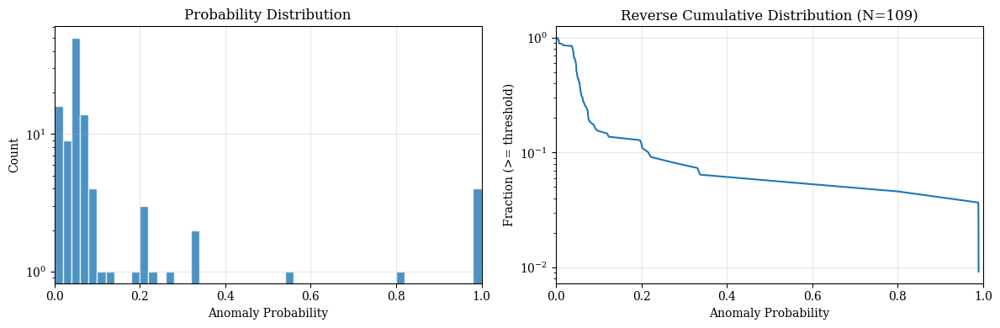

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# 히스토그램
axes[0].hist(df_result["prob"], bins=np.linspace(0, 1, 51), edgecolor="white", alpha=0.8)
axes[0].set_xlabel("Anomaly Probability")
axes[0].set_ylabel("Count")
axes[0].set_title("Probability Distribution")
axes[0].set_xlim(0, 1)
axes[0].set_yscale("log")
axes[0].grid(alpha=0.3)

# Reverse Cumulative
sorted_probs = np.sort(df_result["prob"])
cumulative = np.arange(1, len(sorted_probs) + 1)

axes[1].plot(sorted_probs, cumulative[::-1] / len(df_result))
axes[1].set_xlabel("Anomaly Probability")
axes[1].set_ylabel("Fraction (>= threshold)")
axes[1].set_title(f"Reverse Cumulative Distribution (N={len(df_result)})")
axes[1].set_xlim(0, 1)
axes[1].set_yscale("log")
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [16]:
row = df_result.iloc[0]
band_paths = {b: row[f"filepath{b}"] for b in range(1, 7)}

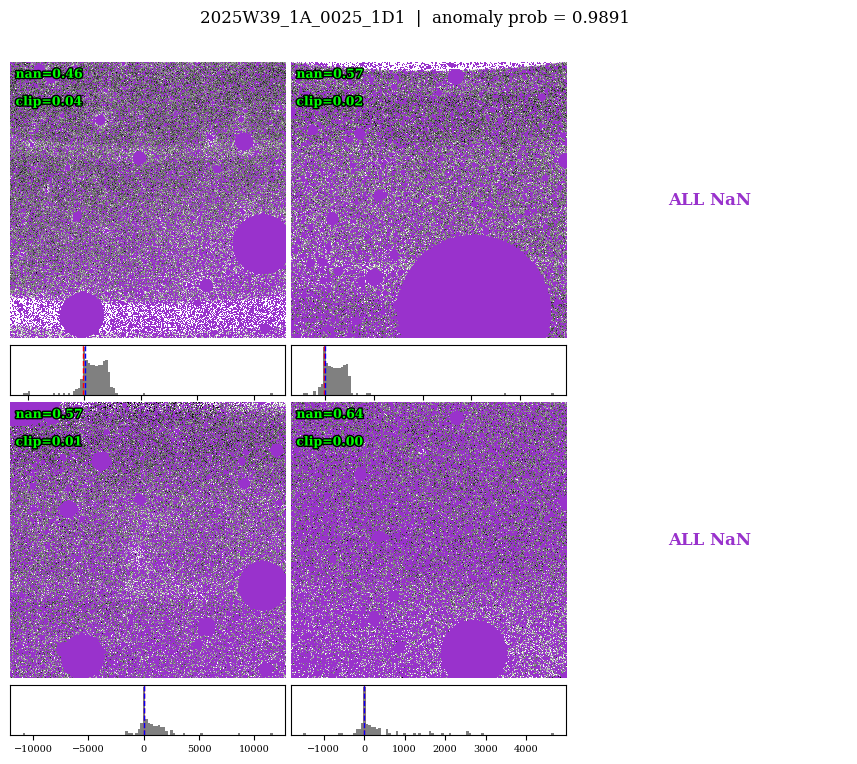

In [17]:
visualize_raw_bands_fits(band_paths, prob=row["prob"])

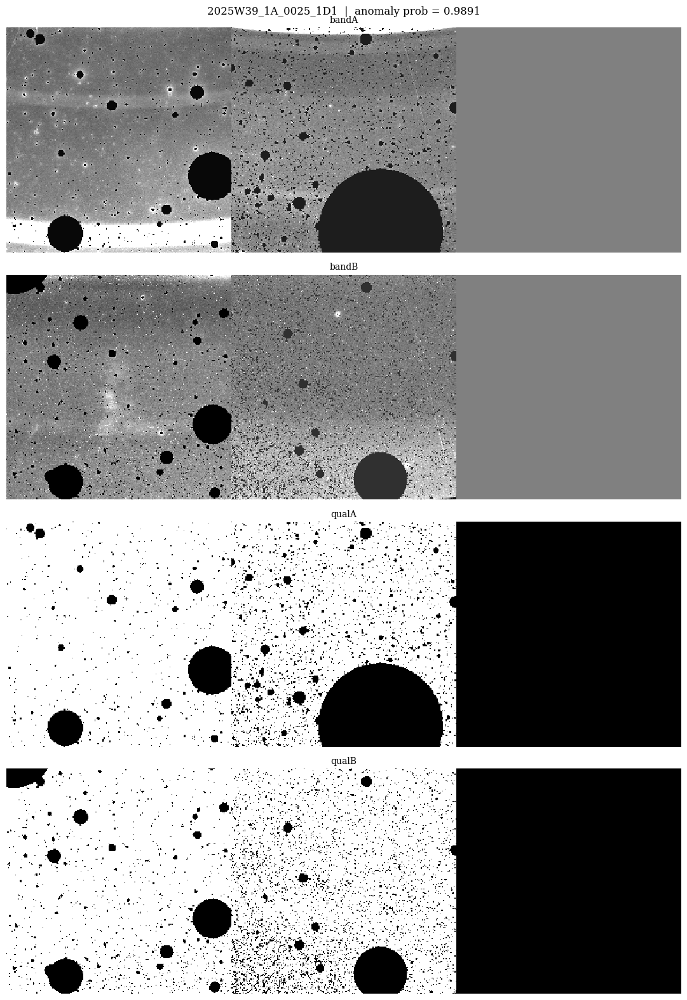

In [18]:
visualize_model_input_fits(band_paths, prob=row["prob"])

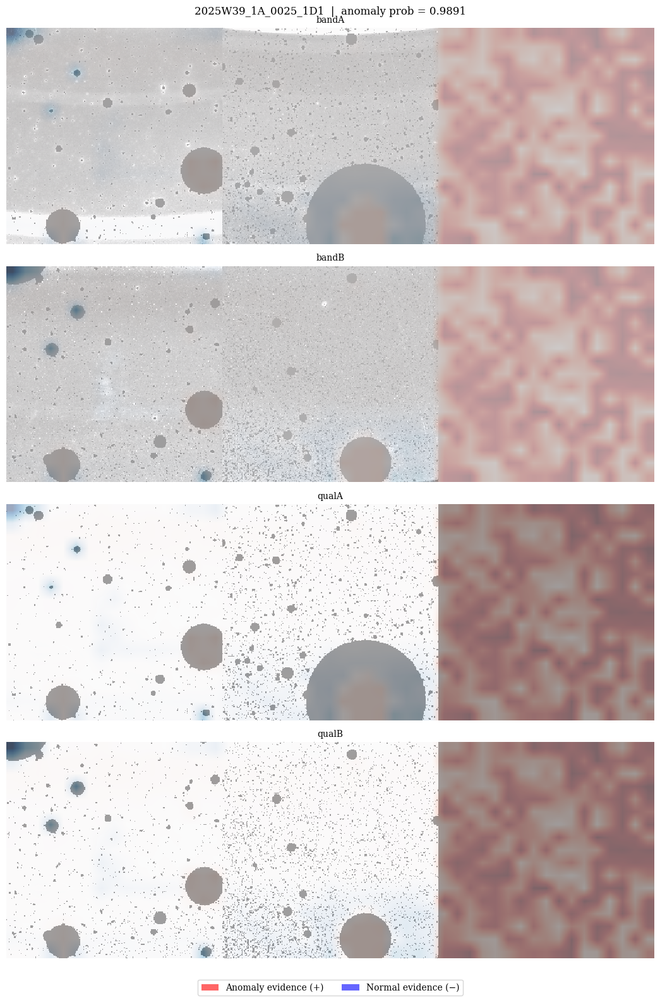

In [19]:
visualize_grad_attention_fits(model, band_paths, prob=row["prob"])

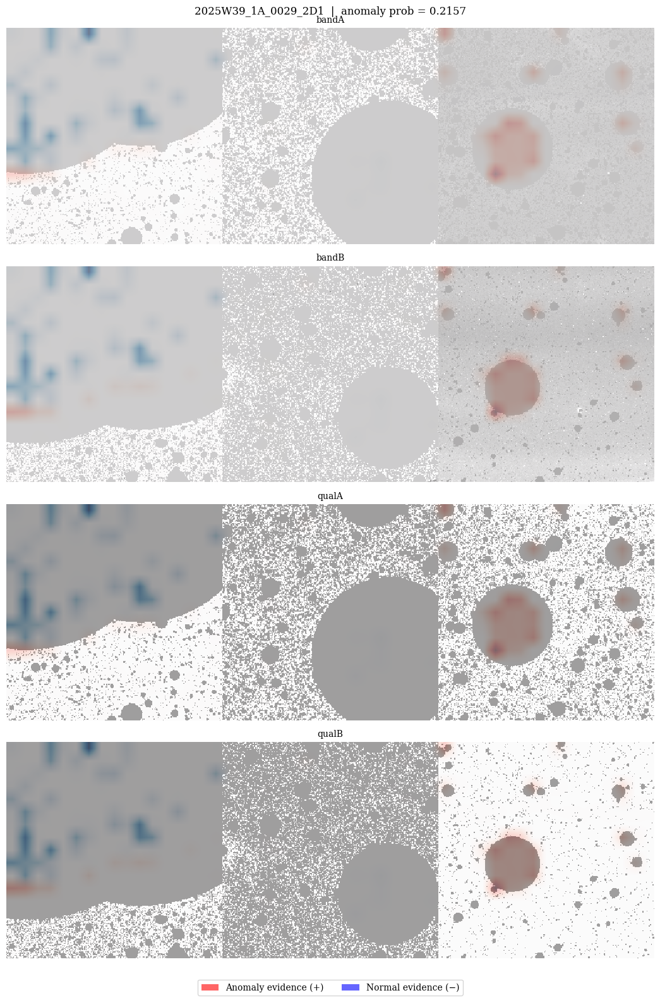

In [20]:
row = df_result.iloc[10]
band_paths = {b: row[f"filepath{b}"] for b in range(1, 7)}
visualize_grad_attention_fits(model, band_paths, prob=row["prob"])

## GIF Animations of ViT Anomaly Detector Results

In [21]:
from PIL import Image
import io

frames = []

for idx in range(0, 40, 1):   # 1개 간격으로
    row = df_result.iloc[idx]
    band_paths = {b: row[f"filepath{b}"] for b in range(1, 7)}

    prob = row["prob"]
    obs_id = row["obs_id"]

    img_4ch = preprocess_fits(band_paths)

    # grad attention
    xb = torch.from_numpy(img_4ch).unsqueeze(0)
    B, C, H, W = xb.shape
    grid_h = H // 15
    grid_w = W // 15

    model.eval()
    model.zero_grad(set_to_none=True)

    logits, attn = model(xb, return_attn=True)
    logits.sum().backward()

    attn_grad = attn.grad
    attn_cls = attn[:, :, 0, 1:]
    grad_cls  = attn_grad[:, :, 0, 1:]
    grad_attn = (attn_cls * grad_cls).mean(dim=1)

    pos = torch.clamp( grad_attn, min=0.0).reshape(1, grid_h, grid_w)
    neg = torch.clamp(-grad_attn, min=0.0).reshape(1, grid_h, grid_w)

    pos = F.interpolate(pos.unsqueeze(1), size=(H, W), mode="bilinear", align_corners=False).squeeze()
    neg = F.interpolate(neg.unsqueeze(1), size=(H, W), mode="bilinear", align_corners=False).squeeze()

    def _norm(m):
        m = m - m.min()
        return m / (m.max() + 1e-8)

    pos_norm = _norm(pos.detach().cpu().numpy())
    neg_norm = _norm(neg.detach().cpu().numpy())

    cmap_gray = plt.get_cmap("gray").copy()
    names = ["bandA", "bandB", "qualA", "qualB"]

    fig, axes = plt.subplots(4, 1, figsize=(12, 4 * 4))
    fig.suptitle(f"{obs_id}  |  anomaly prob = {prob:.4f}", fontsize=12)

    for ch in range(4):
        ax = axes[ch]
        img = img_4ch[ch]

        if ch < 2:
            vmin, vmax = -5, 5
            img_show = np.ma.masked_invalid(img)
        else:
            vmin, vmax = 0.0, 1.0
            img_show = img

        ax.imshow(img_show, origin="lower", cmap=cmap_gray,
                  vmin=vmin, vmax=vmax, interpolation="nearest", aspect="equal")
        ax.imshow(pos_norm, origin="lower", cmap="Reds", alpha=0.4, aspect="equal")
        ax.imshow(neg_norm, origin="lower", cmap="Blues", alpha=0.4, aspect="equal")
        ax.set_title(names[ch], fontsize=10)
        ax.axis("off")

    from matplotlib.patches import Patch
    legend = [
        Patch(facecolor="red",  alpha=0.6, label="Anomaly evidence (+)"),
        Patch(facecolor="blue", alpha=0.6, label="Normal evidence (−)"),
    ]
    fig.legend(handles=legend, loc="lower center", ncol=2, fontsize=10)
    plt.tight_layout(rect=[0, 0.03, 1, 1])

    buf = io.BytesIO()
    fig.savefig(buf, format="png", dpi=72)
    buf.seek(0)
    frames.append(Image.open(buf).copy())
    plt.close(fig)
    print(f"✅ idx={idx}  obs_id={obs_id}  prob={prob:.4f}")

# GIF 저장
frames[0].save(
    "grad_attention_fits.gif",
    save_all=True,
    append_images=frames[1:],
    duration=2000,
    loop=0
)
print("✅ Saved: grad_attention_fits.gif")

✅ idx=0  obs_id=2025W39_1A_0025_1  prob=0.9891
✅ idx=1  obs_id=2025W39_1A_0025_3  prob=0.9890
✅ idx=2  obs_id=2025W39_1A_0025_2  prob=0.9888
✅ idx=3  obs_id=2025W39_1A_0025_4  prob=0.9885
✅ idx=4  obs_id=2025W39_1A_0034_3  prob=0.8002
✅ idx=5  obs_id=2025W39_1A_0006_1  prob=0.5472
✅ idx=6  obs_id=2025W39_1A_0004_1  prob=0.3374
✅ idx=7  obs_id=2025W39_1A_0004_3  prob=0.3312
✅ idx=8  obs_id=2025W39_1A_0029_1  prob=0.2703
✅ idx=9  obs_id=2025W39_1A_0034_4  prob=0.2220
✅ idx=10  obs_id=2025W39_1A_0029_2  prob=0.2157
✅ idx=11  obs_id=2025W39_1A_0004_2  prob=0.2014
✅ idx=12  obs_id=2025W39_1A_0034_1  prob=0.2003
✅ idx=13  obs_id=2025W39_1A_0034_2  prob=0.1967
✅ idx=14  obs_id=2025W39_1A_0029_3  prob=0.1235
✅ idx=15  obs_id=2025W39_1A_0004_4  prob=0.1198
✅ idx=16  obs_id=2025W39_1A_0030_3  prob=0.0962
✅ idx=17  obs_id=2025W39_1A_0016_2  prob=0.0911
✅ idx=18  obs_id=2025W39_1A_0016_1  prob=0.0889
✅ idx=19  obs_id=2025W39_1A_0016_3  prob=0.0807
✅ idx=20  obs_id=2025W39_1A_0016_4  prob=0.0766
✅ 

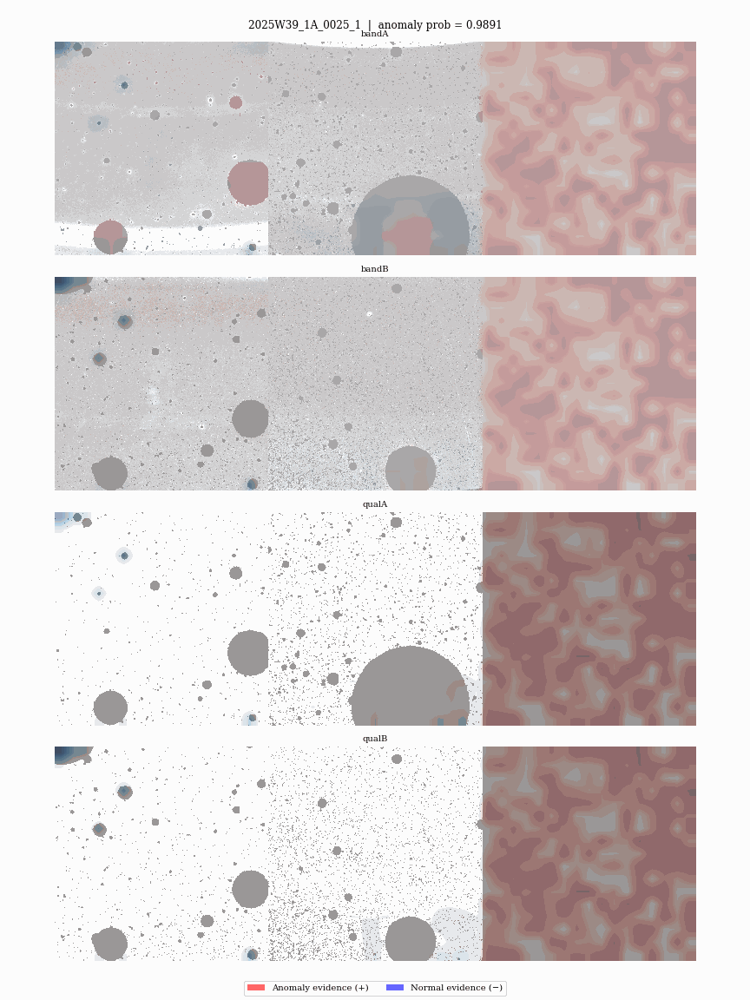

In [22]:
from IPython.display import Image as IPImage
IPImage("grad_attention_fits.gif")